## 1. IMPORTING DATA & BASIC INFORMATION

In [1]:
# importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# importing data
data = pd.read_csv('hotel_cancel.csv')

In [2]:
# data shape
print("data rows & columns ->",data.shape)

data rows & columns -> (119390, 32)


In [3]:
# data's top 5 rows
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


### FEATURE INFORMATIONS
- hotel: 
    ResortHotel (H1) or CityHotel (H2)
- is_canceled: 
    Value indicating if the booking was canceled (1) or not (0)
- lead_time: 
    Number of days that elapsed between the entering date of the booking into the PMS and the arrival date
- arrival_date_year: 
    Year of arrival date
- arrival_date_month: 
    Month of arrival date
- arrival_date_week: 
    Week number of year of arrival date
- arrival_date_day: 
    Day of arrival date
- stays_in_weekend_nights:
    Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
- stays_in_week_nights:
    Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel
- adults:
    Number of adults
- children:
    Number of children
- babies:
    Number of babies
- meal:
    Type of meal booked. Categories are presented in standard hospitality meal packages: Undefined/SC – no meal package; BB – Bed & Breakfast; HB – Half board (breakfast and one other meal – usually dinner); FB – Full board (breakfast, lunch and dinner)
- country:
    Country of origin. Categories are represented in the ISO 3155–3:2013 format
- market_segment:
    Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators”
- distribution_channel:
    Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators”
- is_repeated_guest:
    Value indicating if the booking name was from a repeated guest (1) or not (0)
- previous_cancellations:
    Number of previous bookings that were cancelled by the customer prior to the current booking
- previous_bookings_not_canceled:
    Number of previous bookings not cancelled by the customer prior to the current booking
- reserved_room_type:
    Code of room type reserved. Code is presented instead of designation for anonymity reasons
- assigned_room_type:
    Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request. Code is presented instead of designation for anonymity reasons.
- booking_changes:
    Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation
- deposit_type:
    Indication on if the customer made a deposit to guarantee the booking. This variable can assume three categories: No Deposit – no deposit was made; Non Refund – a deposit was made in the value of the total stay cost; Refundable – a deposit was made with a value under the total cost of stay
- agent:
    ID of the travel agency that made the booking
- company:
    ID of the company/entity that made the booking or responsible for paying the booking. ID is presented instead of designation for anonymity reasons
- days_in_waiting_list:
    Number of days the booking was in the waiting list before it was confirmed to the customer
- customer_type:
    Type of booking, assuming one of four categories: Contract - when the booking has an allotment or other type of contract associated to it; Group – when the booking is associated to a group; Transient – when the booking is not part of a group or contract, and is not associated to other transient booking; Transient-party – when the booking is transient, but is associated to at least other transient booking
- adr:
    Average Daily Rate as defined by dividing the sum of all lodging transactions by the total number of staying nights
- required_car_parking_spaces:
    Number of car parking spaces required by the customer
- total_of_special_requests:
    Number of special requests made by the customer (e.g. twin bed or high floor)
- reservation_status:
    Reservation last status, assuming one of three categories: Canceled – booking was canceled by the customer; Check-Out – customer has checked in but already departed; No-Show – customer did not check-in and did inform the hotel of the reason why
- reservation_status_date:
    Date at which the last status was set. This variable can be used in conjunction with the ReservationStatus to understand when was the booking canceled or when did the customer checked-out of the hotel



In [2]:
# data's summary
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

## 2. NULL VALUE ANALYSIS

In [11]:
# data overview & samples (especially on nan & nan percentage)
listItem = []
for col in data.columns :
    listItem.append([col, data[col].dtype, data[col].isna().sum(), round((data[col].isna().sum()/len(data[col])) * 100,2),
                    data[col].nunique(), list(data[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=['Data Features', 'Data Type', 'Null Count', 'Null %', 'N-Unique', 'Unique Sample'],
                     data=listItem)
dfDesc

,Data Features,Data Type,Null Count,Null %,N-Unique,Unique Sample
0,hotel,object,0,0.00,2,"[Resort Hotel, City Hotel]"
1,is_canceled,int64,0,0.00,2,"[1, 0]"
2,lead_time,int64,0,0.00,479,"[329, 475]"
3,arrival_date_year,int64,0,0.00,3,"[2015, 2017]"
4,arrival_date_month,object,0,0.00,12,"[August, September]"
5,arrival_date_week_number,int64,0,0.00,53,"[17, 21]"
6,arrival_date_day_of_month,int64,0,0.00,31,"[31, 26]"
7,stays_in_weekend_nights,int64,0,0.00,17,"[5, 18]"
8,stays_in_week_nights,int64,0,0.00,35,"[3, 16]"
9,adults,int64,0,0.00,14,"[55, 4]"


In [12]:
# agent (null 14%) feature unique counts
data["agent"].value_counts()

9.0      31961
240.0    13922
1.0       7191
14.0      3640
7.0       3539
         ...  
213.0        1
433.0        1
197.0        1
367.0        1
337.0        1
Name: agent, Length: 333, dtype: int64

In [13]:
# company (null 94%) feature unique counts
data["company"].value_counts()

40.0     927
223.0    784
67.0     267
45.0     250
153.0    215
        ... 
229.0      1
213.0      1
416.0      1
320.0      1
461.0      1
Name: company, Length: 352, dtype: int64

In [14]:
# country (null 0.4%) feature unique counts
data["country"].value_counts()

PRT    48590
GBR    12129
FRA    10415
ESP     8568
DEU     7287
       ...  
BHS        1
AIA        1
DJI        1
MMR        1
GUY        1
Name: country, Length: 177, dtype: int64

In [16]:
# rows with null
len(data[data.isnull().any(axis=1)])

119173

In [19]:
# rows without null
len(data[~data.isnull().any(axis=1)])

217

In [24]:
# trying to find the null combinations
pd.options.display.max_rows = None

null = []
for idx in range(len(data)):
    temp = ""
    for i in data.columns:
        if (str(data[i].iloc[idx]).lower() == 'nan'):
            temp += i+" "            
        else:
            pass
    null.append(temp)

(pd.Series(null)).value_counts()

company                    102677
agent company                9598
agent                        6406
                              217
country agent                 174
country agent company         160
country company               154
children agent company          2
children company                2
dtype: int64

From the observations:

- It turns out that 'agent' & 'company' columns has more than 10% null values, where 'company' even has at least 94% null value.
These columns has so much null rows that perhaps it is safer to drop them. Moreover,
the null rows & columns appears to be at random, thereby creating noise. To avoid bias (by imputing many null values with speficied inputs), we could first drop 'agent' & 'company' columns and then drop the remaining null rows.

In [89]:
# creating copied data for contigency
mydata = data.copy()

# dropping columns & then the remaining null rows
mydata = mydata.drop(['agent','company'], axis=1)
mydata = mydata.dropna()

# resetting index
mydata.reset_index(drop=True)

# data's new shape
print("before ->",data.shape)
print("after  ->",mydata.shape)


before -> (119390, 32)
after  -> (118898, 30)


In [8]:
# final null values checking
mydata.isnull().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces       0
total_of_special_requests   

## 3. EXPLORATORY DATA ANALYSIS

In [40]:
# basic description for numerical features
pd.options.display.max_rows = None
mydata.describe().T

,count,mean,std,min,25%,50%,75%,max
is_canceled,118898.0,0.371352,0.483168,0.00,0.0,0.0,1.0,1.0
lead_time,118898.0,104.311435,106.903309,0.00,18.0,69.0,161.0,737.0
arrival_date_year,118898.0,2016.157656,0.707459,2015.00,2016.0,2016.0,2017.0,2017.0
arrival_date_week_number,118898.0,27.166555,13.589971,1.00,16.0,28.0,38.0,53.0
arrival_date_day_of_month,118898.0,15.800880,8.780324,1.00,8.0,16.0,23.0,31.0
stays_in_weekend_nights,118898.0,0.928897,0.996216,0.00,0.0,1.0,2.0,16.0
stays_in_week_nights,118898.0,2.502145,1.900168,0.00,1.0,2.0,3.0,41.0
adults,118898.0,1.858391,0.578576,0.00,2.0,2.0,2.0,55.0
children,118898.0,0.104207,0.399172,0.00,0.0,0.0,0.0,10.0
babies,118898.0,0.007948,0.097380,0.00,0.0,0.0,0.0,10.0


In [14]:
# basic description for numerical features based on canceled or not 
pd.options.display.max_rows = None
mydata.groupby('is_canceled').describe().T

is_canceled                                      0             1
lead_time                      count  74745.000000  44153.000000
                               mean      80.320209    144.925305
                               std       91.188534    118.636141
                               min        0.000000      0.000000
                               25%        9.000000     49.000000
                               50%       46.000000    113.000000
                               75%      125.000000    215.000000
                               max      737.000000    629.000000
arrival_date_year              count  74745.000000  44153.000000
                               mean    2016.148732   2016.172763
                               std        0.703289      0.714216
                               min     2015.000000   2015.000000
                               25%     2016.000000   2016.000000
                               50%     2016.000000   2016.000000
                               75%     2017.000000   2017.000000
                               max     2017.000000   2017.000000
arrival_date_week_number       count  74745.000000  44153.000000
                               mean      27.088581     27.298553
                               std       13.880826     13.081958
                               min        1.000000      1.000000
                               25%       16.000000     17.000000
                               50%       28.000000     27.000000
                               75%       38.000000     38.000000
                               max       53.000000     53.000000
arrival_date_day_of_month      count  74745.000000  44153.000000
                               mean      15.842224     15.730890
                               std        8.775448      8.788230
                               min        1.000000      1.000000
                               25%        8.000000      8.000000
                               50%       16.000000     16.000000
                               75%       23.000000     23.000000
                               max       31.000000     31.000000
stays_in_weekend_nights        count  74745.000000  44153.000000
                               mean       0.930912      0.925486
                               std        0.989504      1.007478
                               min        0.000000      0.000000
                               25%        0.000000      0.000000
                               50%        1.000000      1.000000
                               75%        2.000000      2.000000
                               max       16.000000     16.000000
stays_in_week_nights           count  74745.000000  44153.000000
                               mean       2.466934      2.561751
                               std        1.912320      1.877933
                               min        0.000000      0.000000
                               25%        1.000000      1.000000
                               50%        2.000000      2.000000
                               75%        3.000000      3.000000
                               max       41.000000     40.000000
adults                         count  74745.000000  44153.000000
                               mean       1.832430      1.902340
                               std        0.509255      0.677748
                               min        0.000000      0.000000
                               25%        2.000000      2.000000
                               50%        2.000000      2.000000
                               75%        2.000000      2.000000
                               max        4.000000     55.000000
children                       count  74745.000000  44153.000000
                               mean       0.102749      0.106675
                               std        0.391615      0.411643
                               min        0.000000      0.000000
                               25% 

In [5]:
# basic description for categorical features
pd.options.display.max_rows = None
mydata.describe(include="object").T

,count,unique,top,freq
hotel,118898,2,City Hotel,79302
arrival_date_month,118898,12,August,13852
meal,118898,5,BB,91863
country,118898,177,PRT,48586
market_segment,118898,7,Online TA,56402
distribution_channel,118898,5,TA/TO,97730
reserved_room_type,118898,10,A,85601
assigned_room_type,118898,12,A,73863
deposit_type,118898,3,No Deposit,104163
customer_type,118898,4,Transient,89174


In [6]:
# basic description for categorical features based on canceled or not
pd.options.display.max_rows = None
mydata.groupby('is_canceled').describe(include="object").T

is_canceled                              0           1
hotel                   count        74745       44153
                        unique           2           2
                        top     City Hotel  City Hotel
                        freq         46226       33076
arrival_date_month      count        74745       44153
                        unique          12          12
                        top         August      August
                        freq          8618        5234
meal                    count        74745       44153
                        unique           5           5
                        top             BB          BB
                        freq         57411       34452
country                 count        74745       44153
                        unique         165         127
                        top            PRT         PRT
                        freq         21071       27515
market_segment          count        74745       44153
                        unique           7           7
                        top      Online TA   Online TA
                        freq         35664       20738
distribution_channel    count        74745       44153
                        unique           5           4
                        top          TA/TO       TA/TO
                        freq         57611       40119
reserved_room_type      count        74745       44153
                        unique           9          10
                        top              A           A
                        freq         52022       33579
assigned_room_type      count        74745       44153
                        unique          10          12
                        top              A           A
                        freq         40958       32905
deposit_type            count        74745       44153
                        unique           3           3
                        top     No Deposit  No Deposit
                        freq         74526       29637
customer_type           count        74745       44153
                        unique           4           4
                        top      Transient   Transient
                        freq         52714       36460
reservation_status      count        74745       44153
                        unique           1           2
                        top      Check-Out    Canceled
                        freq         74745       42950
reservation_status_date count        74745       44153
                        unique         805         902
                        top     2015-12-08  2015-10-21
                        freq           243        1373

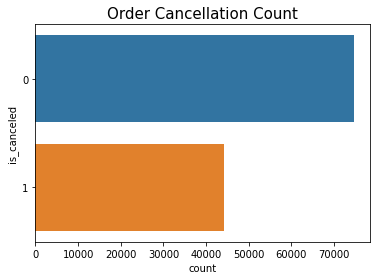

In [6]:
# basic description for targer feature ("is_canceled")
plt.title("Order Cancellation Count", fontdict={'fontsize': 15})
sns.countplot(data = mydata, y ='is_canceled')

### 3a) Pearson Correlation Analysis

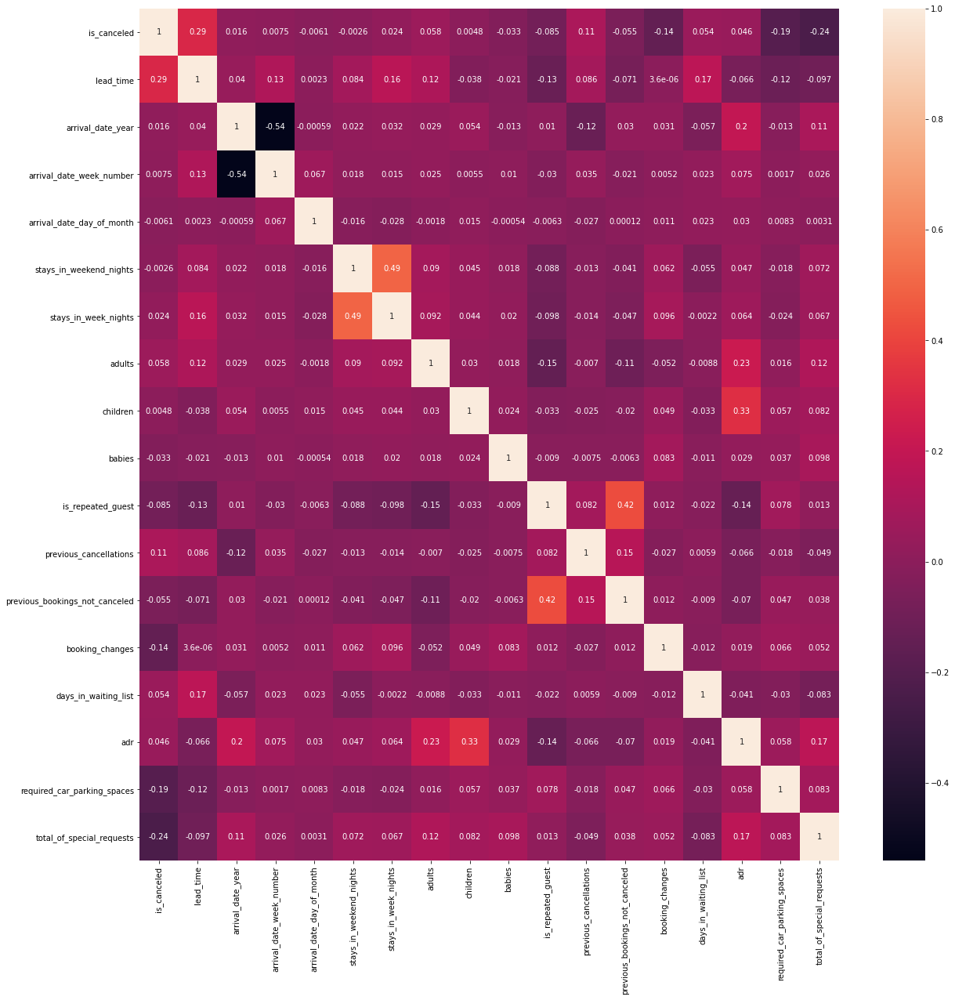

In [18]:
# plotting pearson correlation heatmap
plt.figure(figsize=(20,20))
sns.heatmap(mydata.corr(), annot=True)

In terms of Pearson Correlation:
- There seems to be a moderate positive linear relationship between lead_time (days between booking & arrival date) & is_canceled (order cancellation) feature
- There seems to be a weak positive linear relationship between previous_cancellations (amount of previous canceled orders) & is_canceled feature
- There seems to be a weak negative linear relationship between total_of_special_requests (amounts of special requests made) & is_canceled feature. The same relationship also apparent between required_car_parking_spaces (amount of parkings space required) is_canceled feature.
- There seems to be a very weak or no linear relationship at all between the rest of the features & is_canceled feature (note that I dont include booking_changes because it's a feature of potential leakage)

### 3b) Spearman Correlation Analysis

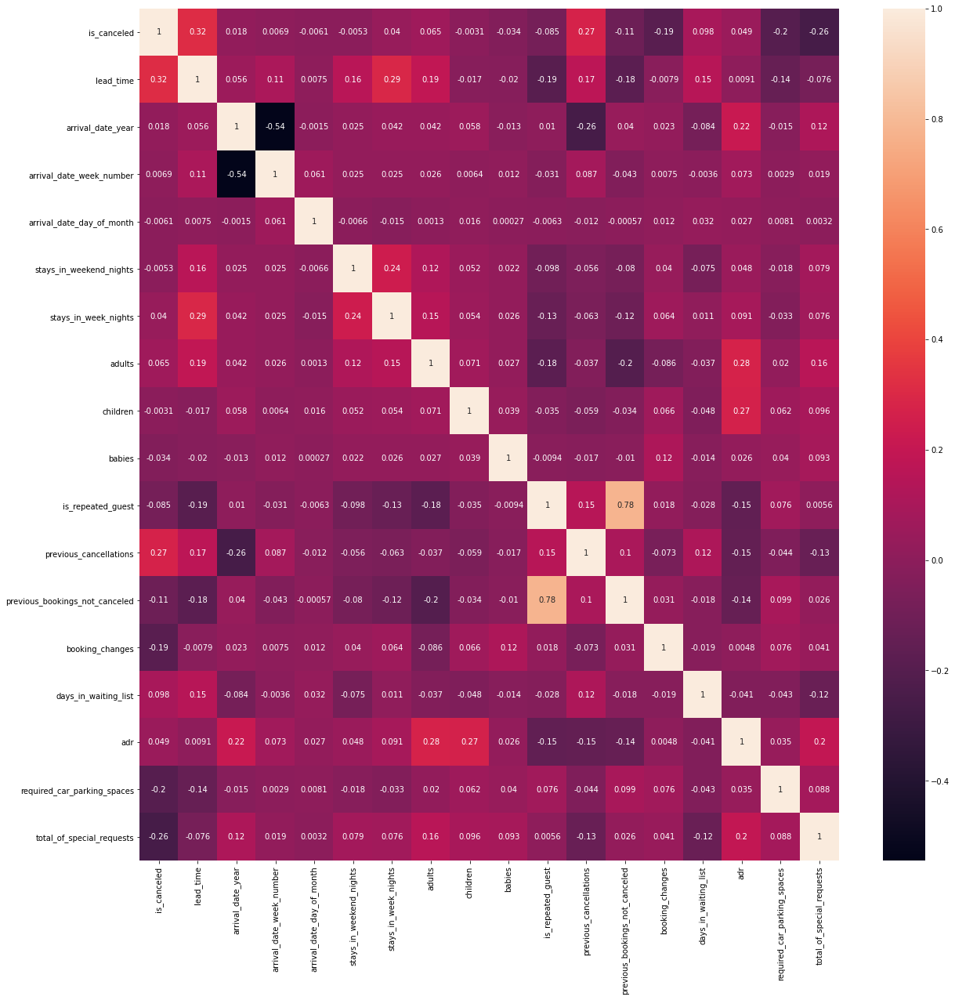

In [19]:
# plotting spearman correlation heatmap
plt.figure(figsize=(20,20))
sns.heatmap(mydata.corr("spearman"), annot=True)

In terms of Spearman Correlation:
- There seems to be a moderate positive monotonic relationship between both lead_time & previous_cancellations on is_canceled feature
- There seems to be a weak negative monotonic relationship between features such as total_of_special_requests, required_car_parking_spaces, previous_bookings_not_canceled (amounts of stayed orders) on is_canceled feature
- There seems to be a very weak or no monotonic relationship at all between the rest of the features & is_canceled feature

### 3c) Cramer's V Analysis

In [13]:
# defining cramers v function to see the association between two categorical features
def cramers_v(x,y):
    import scipy.stats as ss
    confusion_matrix = pd.crosstab(x,y)
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r -((r-1)**2)/(n-1)
    kcorr = k -((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

In [14]:
# cramer's v value for each categorical columns towards target variable
categorical_columns = mydata.select_dtypes('object').columns
print ("Cramer's V")
for i in categorical_columns:
    print("-"+i+":\n {}".format(cramers_v(mydata[i], mydata['is_canceled'])))

Cramer's V
-hotel:
 0.13391504405557528
-arrival_date_month:
 0.06808062445518374
-meal:
 0.05024800103275079
-country:
 0.3353977614237734
-market_segment:
 0.26558878969339056
-distribution_channel:
 0.17512569541772424
-reserved_room_type:
 0.0727419037395779
-assigned_room_type:
 0.20162523518112685
-deposit_type:
 0.4813569864414018
-customer_type:
 0.13770743323770232
-reservation_status:
 0.9999957946352162
-reservation_status_date:
 0.48102756335637586


In terms of Cramer's V:
- There seems to be a moderate association in features such as country (country origin), market segments (market segmentation; just like distribution_channel but more detailed), customer_type (types of customer), deposit_type (types of deposit) on our target variable of is_canceled feature
- There seems to be a weak association between hotel (hotel type) & is_canceled feature
- There seems to be no association between the rest of the features & is_canceled feature (assigned_room_type, reservation_status, reservation_status_date are features leaking is_canceled information)



### 3d) On Market Segments

In [101]:
# total bookings per market segment
mysegments1 = mydata[mydata['is_canceled']==1]['market_segment'].value_counts()
mysegments2 = mydata[mydata['is_canceled']==0]['market_segment'].value_counts()

# pie plot for canceled orders
fig1 = px.pie(mysegments1, values= mysegments1.values, names=mysegments1.index,
             title="Booking per market segment for canceled orders")
fig1.update_traces(rotation=-90, textinfo="percent+label")
fig1.show()

# pie plot for stayed orders
fig2 = px.pie(mysegments2, values= mysegments2.values, names=mysegments2.index,
             title="Booking per market segment for stayed orders")
fig2.update_traces(rotation=-90, textinfo="percent+label")
fig2.show()

From the observations:
- In terms of market segment, both canceled & stayed orders are for the largest part generated by Online TA. This makes sense due to the increasing presence & usage of Online TA's by customers (as it's easier for them to compare & book hotels) & hotels (as it's easier for them to showcase their facilities & receive popular tractions)
- What's quite interesting is that for the canceled orders, the Groups segment is significanty larger than their counterpart (stayed orders) in terms of relative size (27.4% compared to 10.3%) & order counts (12,097 compared to 7,709). This goes as well for the Direct segment where their canceled orders are significantly smaller in terms of relative size (4.35% compared to 14.1%) & order counts (1,920 compared to 10,528). 


### 3e) On Repeater Guests

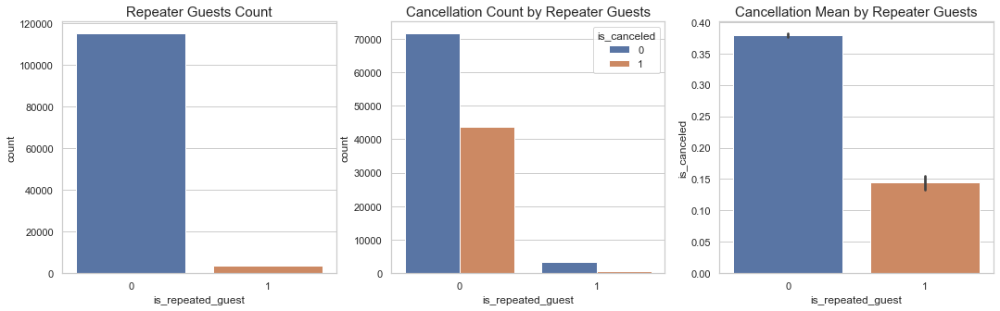

In [133]:
sns.set(style = "whitegrid")
plt.figure(figsize= (18,5))

# countplot for repeated guest count
plt.subplot(1,3,1)
plt.title("Repeater Guests Count", fontdict={'fontsize': 15})
sns.countplot(data=mydata, x="is_repeated_guest")

# countplot for cancellation count wth repeated guest hue
plt.subplot(1,3,2)
plt.title("Cancellation Count by Repeater Guests", fontdict={'fontsize': 15})
sns.countplot(data=mydata, x="is_repeated_guest", hue='is_canceled')

# barplot for repeated guest & cancellation
plt.subplot(1,3,3)
plt.title("Cancellation Mean by Repeater Guests", fontdict={'fontsize': 15})
sns.barplot(data=mydata, y="is_canceled", x='is_repeated_guest')

From the observations:
- In terms of repeater guest count, it is not surprising that there is much less repeater guests than non-repeater guests. For repeater guests are loyal customers that's hard  to come by or cultivated. They surely need to be treated well & exclusively so that they shall remain as loyal customers.
- In terms of cancellation counts, It is not surprising as well to see that more cancellation counts are from non-repeater guests than repeater guests. That account is surely represented in the next plot that shows non-repeater guests have higher mean towards cancellation (closer to value of 1) than repeater guests with at least 0,3 mean differences. In other words, non-repeater guest has a higher average to cancel than repeater guests.
  

### 3f) On Lead Time

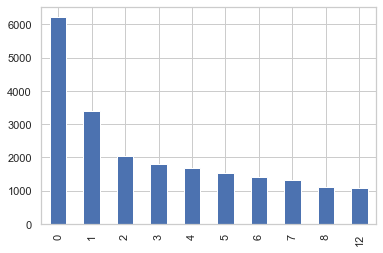

In [82]:
# plot for highest occuring lead time
mydata['lead_time'].value_counts().head(10).plot(kind="bar")

In [130]:
# percentage of top 2 most frequent values 
print("Percentage of last-minute bookers:",sum(mydata['lead_time'].value_counts(normalize=True).head(2).values))

# percentage of the rest of values
print("Percentage of early-bookers:",sum(mydata['lead_time'].value_counts(normalize=True).values)-sum(mydata['lead_time'].value_counts(normalize=True).head(2).values))

Percentage of last-minute bookers: 0.08087604501337281
Percentage of early-bookers: 0.9191239549866266


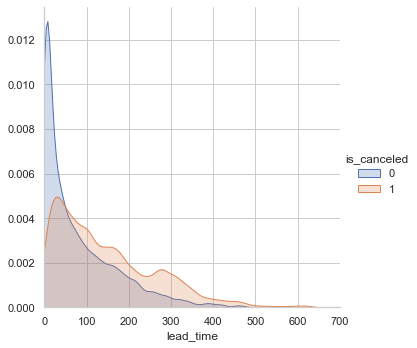

In [116]:
# plotting kdeplot with cancellation as hue
sns.FacetGrid(data, hue ='is_canceled', height=5, xlim=(0,700)).map(sns.kdeplot,'lead_time', shade = True).add_legend()

In [102]:
# scatter plot of lead time, previous cancellations & order cancellation
fig = px.scatter(mydata, x='lead_time', y='previous_cancellations', color='is_canceled',
                 title="Lead-time, Previous Cancellations & Order Cancellation")
fig.update_layout(autosize=False,width=700,height=500,margin=dict(l=50,r=50,b=100,t=100,pad=4))
fig.show()

From the observations:
- In terms of lead time (days) value count, it seems that the highest count is still achieved by 0 lead time or same-day bookings, followed by 1 lead time or previous-day bookings. In other words, these categories are last-minute bookers. Hotels may differ about the threshold but usually, customers with more than 1 day lead time could be considered as early bookers.
- It appears that 91,9% of them are early bookers & only 8% are last-minute bookers. This may turn out to be interesting since the early bookers, according to the KDE plot, have a larger propensity to cancel their bookings once its reaches >=50 days lead time. Based on their previous descriptions, we could also see that the group mean & median for stayed orders are 80 & 40 days (in lead time), respectively. It is surely far smaller than the group mean & median for canceled orders of 114 & 113 days, respectively. More indication that the longer the lead time, the bigger amount of order cancellations.
- If we connect the plots with previous cancellations feature, we could also see that the higher previous cancellations a customer has, especially when it has greater lead time, the greater propensity for them to cancel their current order.
  

### 3g) On Deposit Type

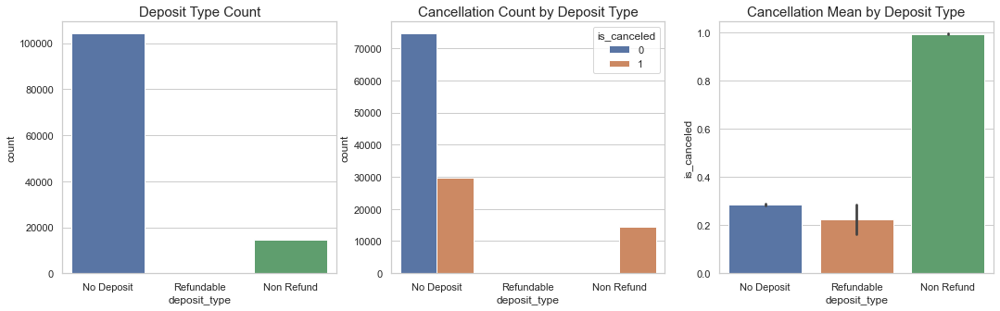

In [131]:
sns.set(style = "whitegrid")
plt.figure(figsize= (18,5))

# countplot for deposit type count
plt.subplot(1,3,1)
plt.title("Deposit Type Count", fontdict={'fontsize': 15})
sns.countplot(data=mydata, x="deposit_type")

# countplot for cancellation count wth cancellation hue
plt.subplot(1,3,2)
plt.title("Cancellation Count by Deposit Type", fontdict={'fontsize': 15})
sns.countplot(data=mydata, x="deposit_type", hue='is_canceled')

# barplot for deposit type & cancellation
plt.subplot(1,3,3)
plt.title("Cancellation Mean by Deposit Type", fontdict={'fontsize': 15})
sns.barplot(data=mydata, y="is_canceled", x='deposit_type')

In [136]:
# crosstab for deposit type & order cancellation
pd.crosstab(mydata['deposit_type'],mydata['is_canceled'])

is_canceled,0,1
deposit_type,,
No Deposit,74526,29637
Non Refund,93,14480
Refundable,126,36


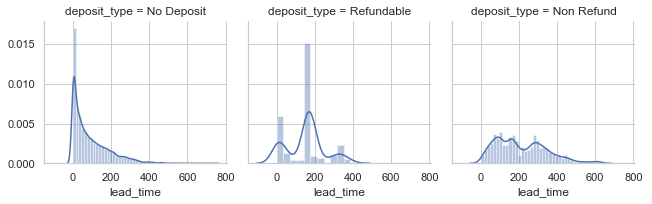

In [104]:
# lead_time distribution by deposit_type
sns.set_style("whitegrid")
sns.FacetGrid(data=mydata, col='deposit_type').map(sns.distplot,'lead_time').add_legend()

In [97]:
# looking at non refund deposits yet cancelling orders 
NonRefund_1 = mydata[(mydata['deposit_type']=='Non Refund') & (mydata['is_canceled']==1)]
NonRefund_1.describe().T

,count,mean,std,min,25%,50%,75%,max
is_canceled,14480.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
lead_time,14480.0,213.613398,133.390755,0.0,103.0,186.0,305.0,629.0
arrival_date_year,14480.0,2016.032735,0.731447,2015.0,2015.0,2016.0,2017.0,2017.0
arrival_date_week_number,14480.0,27.480387,13.330748,1.0,17.0,25.0,39.0,53.0
arrival_date_day_of_month,14480.0,15.622583,8.690822,1.0,8.0,16.0,23.0,31.0
stays_in_weekend_nights,14480.0,0.620994,0.820688,0.0,0.0,0.0,1.0,7.0
stays_in_week_nights,14480.0,2.094268,1.152934,0.0,1.0,2.0,3.0,16.0
adults,14480.0,1.813122,0.392476,1.0,2.0,2.0,2.0,3.0
children,14480.0,0.000276,0.020355,0.0,0.0,0.0,0.0,2.0
babies,14480.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0


From the observations:
- In terms of deposit type count, it seems that most of the customers (87,6%) prefer bookings with No Deposit while only little of them prefers Refundable type (0,1%). No wonder that most order cancellation counts is within the No Deposit type.
- Counterintuitively, the plot shows that the Non Refund type has the highest average of order cancellations. Interestingly, it does have a significantly smaller stayed order (93 orders) compared ot its canceled orders (14,480 orders). In other words, most of the customers who chooses Non Refund canceled their orders. Very counterintuitive.
- It appears that most customers who canceled their Non Refund deposits has lead_time of 103++ days (gap until arrival time) with median of 186 days & average of 213 days. These are big lead_time numbers. As we can see from our previous analysis, orders with bigger lead_time (at least after 50++ days) has a bigger propensity to cancel. Perhaps, this is partly why most of the Non Refund deposits are canceled.

### 3h) On Arrival Weeks & Months

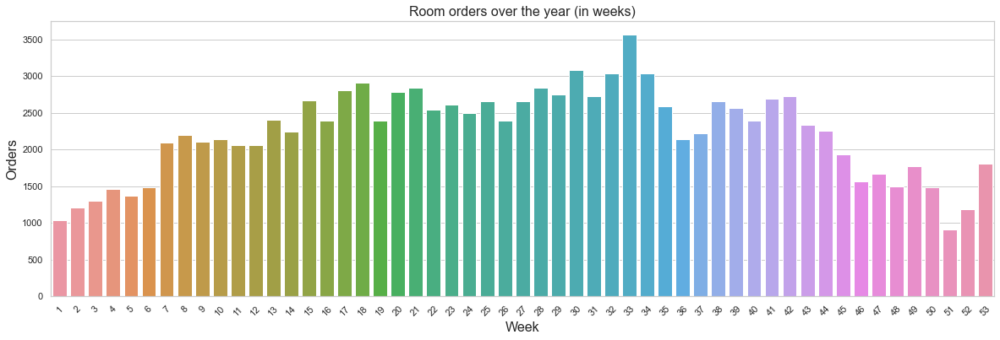

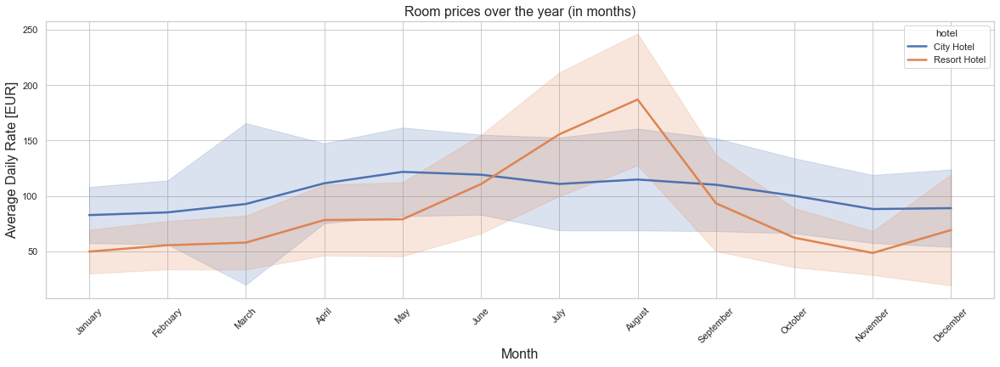

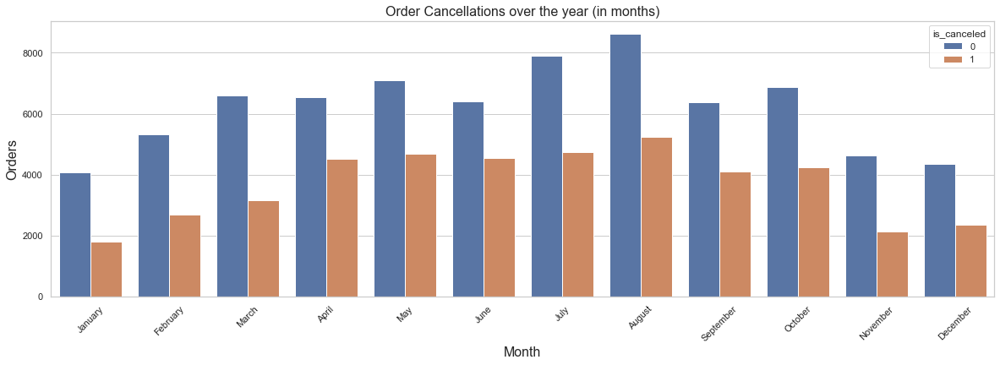

In [9]:
# countplot by week
sns.set(style = "whitegrid")
plt.figure(figsize=(20,6))
sns.countplot(mydata['arrival_date_week_number'])
plt.title("Room orders over the year (in weeks)", fontsize=16)
plt.xlabel("Week", fontsize=16)
plt.xticks(rotation=45)
plt.ylabel("Orders", fontsize=16)
plt.show()

# ordering data by month:
monthly_adr = mydata[["hotel", "arrival_date_month", "adr","is_canceled"]].sort_values("arrival_date_month")
ordered_months = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
monthly_adr["arrival_date_month"] = pd.Categorical(monthly_adr["arrival_date_month"], categories=ordered_months, ordered=True)

# barplot with standard deviation:
plt.figure(figsize=(20, 6))
sns.lineplot(x = "arrival_date_month", y="adr", hue="hotel", data=monthly_adr, 
            hue_order = ["City Hotel", "Resort Hotel"], ci="sd", size="hotel", sizes=(2.5, 2.5))
plt.title("Room prices over the year (in months)", fontsize=16)
plt.xlabel("Month", fontsize=16)
plt.xticks(rotation=45)
plt.ylabel("Average Daily Rate [EUR]", fontsize=16)
plt.show()

# countplot by month
plt.figure(figsize=(20,6))
# sns.countplot(data=mydata, x="deposit_type", hue='is_canceled')
sns.countplot(data=monthly_adr, x="arrival_date_month" , hue="is_canceled")
plt.title("Order Cancellations over the year (in months)", fontsize=16)
plt.xlabel("Month", fontsize=16)
plt.xticks(rotation=45)
plt.ylabel("Orders", fontsize=16)
plt.show()


From the observations:
- In terms of room demand, we can see that in the 30th week until 34th week there's a surge in room bookings, with 33rd week having the highest order count. We can also see that the surge in demand is also translated to higher room prices or average daily rates (adr), especially in the Resort Hotel type. As we all know, this is to no surprise because this surge is happening within the Summer season.
- In terms of order cancellations, we can see that the canceled order amount increases/decreases as there are increases/decreases in room orders (in this case, stayed orders). Nevertheless, we could stil see that the highest surge happens within the Summer months.

### 3i) On Customer Type

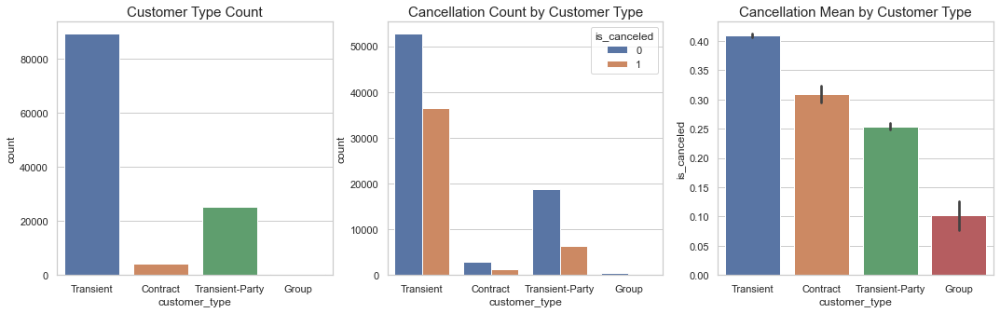

In [5]:
sns.set(style = "whitegrid")
plt.figure(figsize= (18,5))

# countplot for deposit type count
plt.subplot(1,3,1)
plt.title("Customer Type Count", fontdict={'fontsize': 15})
sns.countplot(data=mydata, x="customer_type")

# countplot for cancellation count wth cancellation hue
plt.subplot(1,3,2)
plt.title("Cancellation Count by Customer Type", fontdict={'fontsize': 15})
sns.countplot(data=mydata, x="customer_type", hue='is_canceled')

# barplot for deposit type & cancellation
plt.subplot(1,3,3)
plt.title("Cancellation Mean by Customer Type", fontdict={'fontsize': 15})
sns.barplot(data=mydata, y="is_canceled", x='customer_type')

In [6]:
# crosstab for deposit type & order cancellation
pd.crosstab(mydata['customer_type'],mydata['is_canceled'])

is_canceled,0,1
customer_type,,
Contract,2814,1262
Group,512,58
Transient,52714,36460
Transient-Party,18705,6373


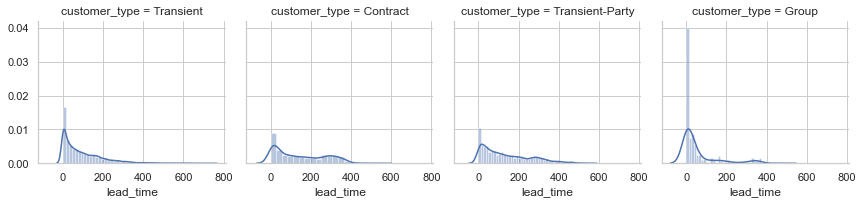

In [105]:
# lead_time distribution by customer_type
sns.set_style("whitegrid")
sns.FacetGrid(data=mydata, col='customer_type').map(sns.distplot,'lead_time').add_legend()

In [100]:
# looking at contract customers yet cancelling orders 
Contract_1 = mydata[(mydata['customer_type']=='Contract') & (mydata['is_canceled']==1)]
Contract_1.describe().T

,count,mean,std,min,25%,50%,75%,max
is_canceled,1262.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
lead_time,1262.0,221.368463,127.360179,0.0,81.0,278.0,325.0,435.0
arrival_date_year,1262.0,2015.220285,0.542237,2015.0,2015.0,2015.0,2015.0,2017.0
arrival_date_week_number,1262.0,35.217116,8.946422,1.0,30.0,36.0,41.0,53.0
arrival_date_day_of_month,1262.0,16.185420,9.019435,1.0,8.0,17.0,24.0,31.0
stays_in_weekend_nights,1262.0,0.901743,1.078893,0.0,0.0,1.0,1.0,8.0
stays_in_week_nights,1262.0,2.497623,2.272389,0.0,1.0,2.0,3.0,19.0
adults,1262.0,1.939778,0.260274,1.0,2.0,2.0,2.0,3.0
children,1262.0,0.041204,0.373442,0.0,0.0,0.0,0.0,10.0
babies,1262.0,0.004754,0.068815,0.0,0.0,0.0,0.0,1.0


From the observations:
- In terms of customer type, it seems that the largest part of them are transient types, both individuals & groups. It is to no surprise that that these transient types contribute the most on order cancellation counts. What's surprising is that there are still orders, although a few, that is made by contract types yet canceled.
- After we see the lead_time mean & median of the Contract group, it shows 221 days & 278 days respectively. Again, these are big lead_time numbers, and perhaps it might partly contribute to this group's bigger propensity to cancel

### 3j) On Distributions

[is_canceled]
Not-Normal Distribution
Skewness: 0.5325209386370899, Kurtosis -1.7164214499130723


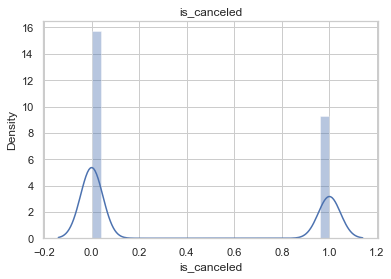



[lead_time]
Not-Normal Distribution
Skewness: 1.3444057917324832, Kurtosis 1.690329417393432


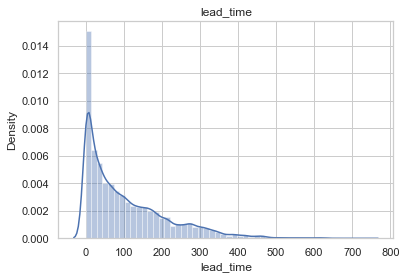



[arrival_date_year]
Not-Normal Distribution
Skewness: -0.23435642363158243, Kurtosis -0.9942810460329863


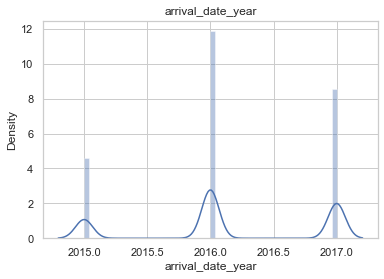



[arrival_date_week_number]
Not-Normal Distribution
Skewness: -0.00991973946969694, Kurtosis -0.983189389240037


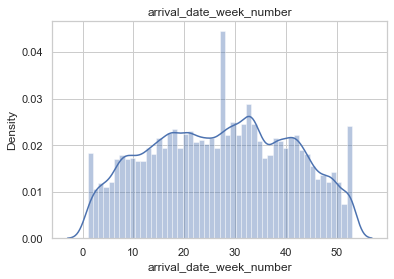



[arrival_date_day_of_month]
Not-Normal Distribution
Skewness: -0.0025262692910389202, Kurtosis -1.1873202109856524


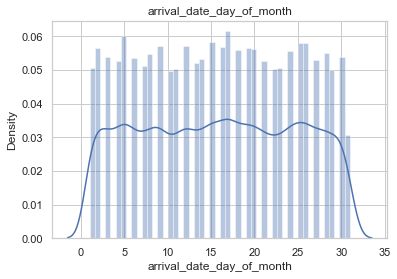



[stays_in_weekend_nights]
Not-Normal Distribution
Skewness: 1.2983453120561024, Kurtosis 5.6608395212


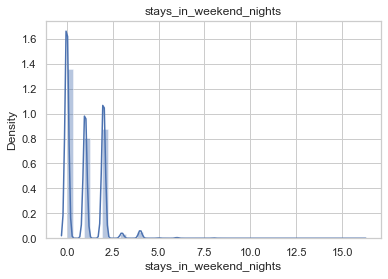



[stays_in_week_nights]
Not-Normal Distribution
Skewness: 2.6976799932861915, Kurtosis 19.98158181419013


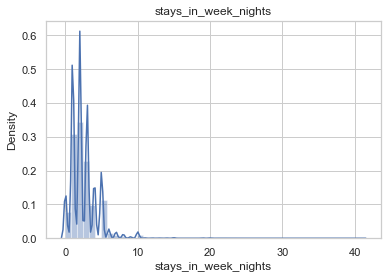



[adults]
Not-Normal Distribution
Skewness: 18.45890977955883, Kurtosis 1363.850020684109


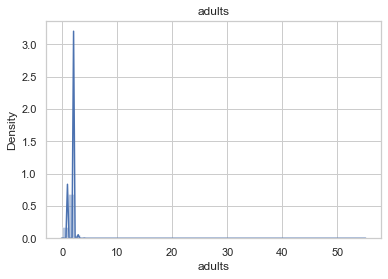



[children]
Not-Normal Distribution
Skewness: 4.105516127075501, Kurtosis 18.605351503929533


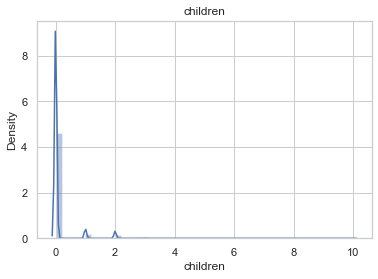



[babies]
Not-Normal Distribution
Skewness: 24.701165686548983, Kurtosis 1642.7823975682538


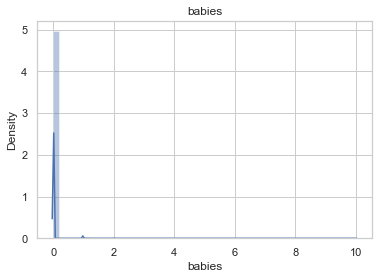



[is_repeated_guest]
Not-Normal Distribution
Skewness: 5.317207053222844, Kurtosis 26.272690846842732


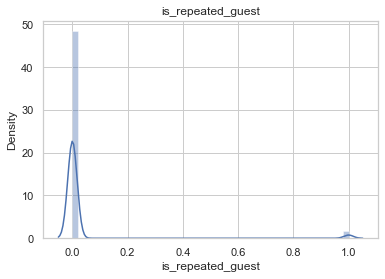



[previous_cancellations]
Not-Normal Distribution
Skewness: 24.42496901087957, Kurtosis 671.9295808235443


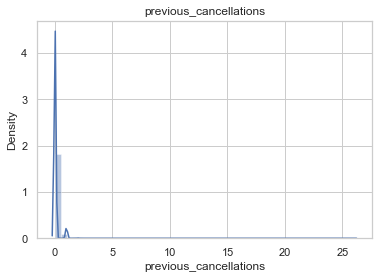



[previous_bookings_not_canceled]
Not-Normal Distribution
Skewness: 24.03644550588247, Kurtosis 794.5762741676398


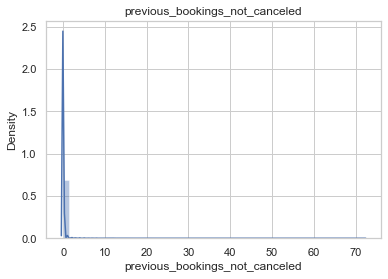



[booking_changes]
Not-Normal Distribution
Skewness: 6.005261660837513, Kurtosis 79.46324072391413


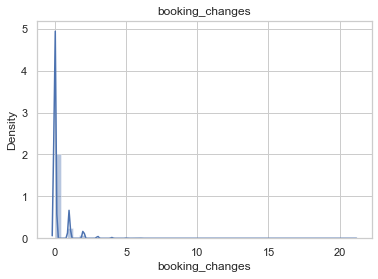



[days_in_waiting_list]
Not-Normal Distribution
Skewness: 11.919230046815915, Kurtosis 186.00435043770787


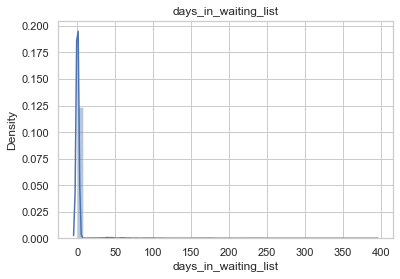



[adr]
Not-Normal Distribution
Skewness: 10.59928380285859, Kurtosis 1021.2333467195931


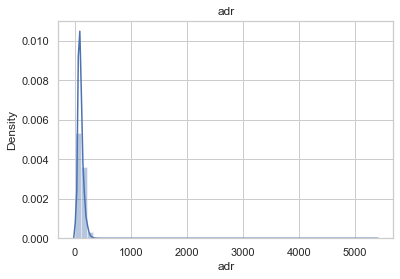



[required_car_parking_spaces]
Not-Normal Distribution
Skewness: 4.195511340349104, Kurtosis 30.594499930765593


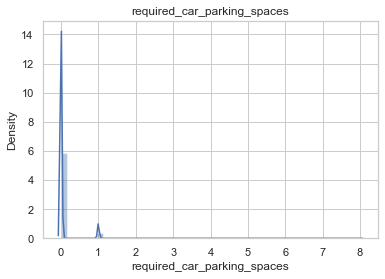



[total_of_special_requests]
Not-Normal Distribution
Skewness: 1.3467031162623373, Kurtosis 1.4798725911168837


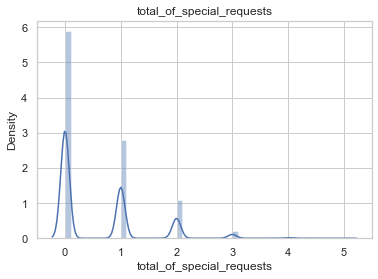

In [106]:
from scipy.stats import shapiro, anderson, skew, kurtosis
for i in mydata.select_dtypes(exclude = 'object').columns:
    print("[{}]".format(i))
    if shapiro(mydata[i])[1] < 0.05:
        print('Not-Normal Distribution')
    else:
        print('Normal Distribution')    
    print('Skewness: {}, Kurtosis {}'.format(skew(mydata[i]), kurtosis(mydata[i])))
    sns.distplot(mydata[i])
    plt.title(i)
    plt.show()
    print('\n')
    

From the observations:
- In terms of data distribution, we could see from our Shapiro Test that all our features has values below 0,05. In other words, none of the numerical features has a normal/Gaussian distribution

## 4. MODEL DEVELOPMENT

### 4a) Data Preprocessing

In [54]:
# making country names into domestic & international 
def tourist(cols):
    if (cols == 'PRT'):
        cols = 'Domestic'
    else:
        cols = 'International'
    return cols
    
mydata['country'] = mydata['country'].apply(tourist)
mydata['country'].value_counts().head(10)

International    70312
Domestic         48586
Name: country, dtype: int64

In [55]:
# streamlining the deposit type into two categories only (0=Flexible; 1=Inflexible)
def yes(cols):
    if (cols == "No Deposit") or (cols == "Refundable"):
        cols = 0 
    else:
        cols = 1
    return cols

mydata['deposit_type'] = mydata['deposit_type'].apply(yes)
mydata['deposit_type'].value_counts()

0    104325
1     14573
Name: deposit_type, dtype: int64

### 4b) Model Preparation

In [58]:
# taking relevant features into model
mycoba = mydata[['hotel','adr','country','lead_time','previous_cancellations','previous_bookings_not_canceled','required_car_parking_spaces','total_of_special_requests',
                 'children','adults','customer_type','deposit_type','market_segment','is_repeated_guest','is_canceled']]

In [59]:
# model features
mycoba.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 118898 entries, 0 to 119389
Data columns (total 15 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           118898 non-null  object 
 1   adr                             118898 non-null  float64
 2   country                         118898 non-null  object 
 3   lead_time                       118898 non-null  int64  
 4   previous_cancellations          118898 non-null  int64  
 5   previous_bookings_not_canceled  118898 non-null  int64  
 6   required_car_parking_spaces     118898 non-null  int64  
 7   total_of_special_requests       118898 non-null  int64  
 8   children                        118898 non-null  float64
 9   adults                          118898 non-null  int64  
 10  customer_type                   118898 non-null  object 
 11  deposit_type                    118898 non-null  int64  
 12  market_segment  

In [85]:
# making dummies for selected categorical columns
mydummy = pd.get_dummies(data= mycoba, drop_first= True, columns = ['hotel','country','customer_type','deposit_type','market_segment'] )
mydummy.columns

Index(['adr', 'lead_time', 'previous_cancellations',
       'previous_bookings_not_canceled', 'required_car_parking_spaces',
       'total_of_special_requests', 'children', 'adults', 'is_repeated_guest',
       'is_canceled', 'hotel_Resort Hotel', 'country_International',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'deposit_type_1',
       'market_segment_Complementary', 'market_segment_Corporate',
       'market_segment_Direct', 'market_segment_Groups',
       'market_segment_Offline TA/TO', 'market_segment_Online TA'],
      dtype='object')

In [61]:
# assigning features
IV = ['adr', 'lead_time', 'previous_cancellations',
       'previous_bookings_not_canceled', 'required_car_parking_spaces',
       'total_of_special_requests', 'children', 'adults', 'is_repeated_guest',
        'hotel_Resort Hotel', 'country_International',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'deposit_type_1',
       'market_segment_Complementary', 'market_segment_Corporate',
       'market_segment_Direct', 'market_segment_Groups',
       'market_segment_Offline TA/TO', 'market_segment_Online TA']

# independent variables
x = mydummy[IV]

# dependent/target variable
y = mydummy['is_canceled']

In [10]:
# splitting the training data - test data = 80% : 20% 
from sklearn.model_selection import train_test_split 
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state= 101)

In [11]:
# create a new x_train & y_train variable (x_trainres & y_trainres) that is resampled using SMOTE method
from imblearn.over_sampling import SMOTE
from collections import Counter

y_train = y_train.astype('int') 
smo = SMOTE(random_state=0, sampling_strategy='minority')
x_trainres, y_trainres = smo.fit_resample(x_train, y_train)
print("normal data (target)      :",sorted(Counter(y_train).items()))
print("oversampled data (target) :",sorted(Counter(y_trainres).items()))

normal data (target)      : [(0, 59743), (1, 35375)]
oversampled data (target) : [(0, 59743), (1, 59743)]


### 4c) Model Comparison

In [14]:
# importing libraries & algorithms to be compared
from sklearn.model_selection import train_test_split, KFold, cross_val_score 
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, fbeta_score 
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import BernoulliNB
from sklearn.svm import SVC
from xgboost import XGBClassifier


# to feed the random state
seed = 7

### ------------- ON ACCURACY -------------

LR: 0.801215 (0.004234)
DT: 0.831262 (0.002528)
RF: 0.852120 (0.002888)
NB: 0.776047 (0.002410)
XGB: 0.852131 (0.004022)
LR2: 0.791022 (0.005910)
DT2: 0.854402 (0.030878)
RF2: 0.875518 (0.035004)
NB2: 0.744730 (0.082139)
XGB2: 0.858436 (0.023602)


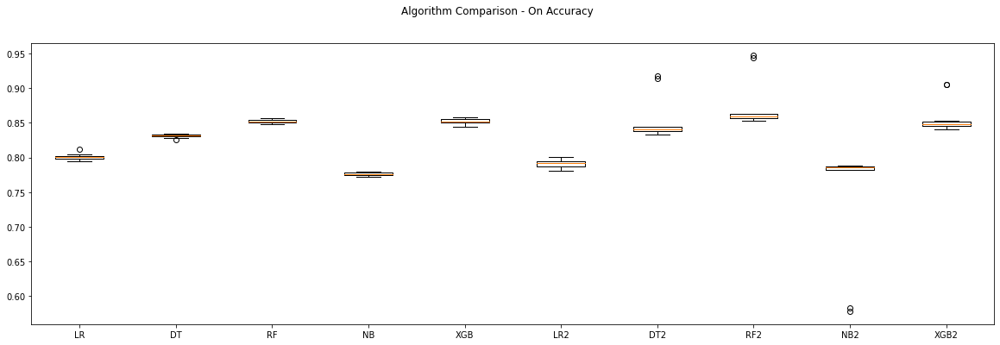

In [20]:
# prepare models
models = []
models.append(('LR', LogisticRegression()))
models.append(('DT', DecisionTreeClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('NB', BernoulliNB()))
models.append(('XGB', XGBClassifier()))
models.append(('LR2', LogisticRegression()))
models.append(('DT2', DecisionTreeClassifier()))
models.append(('RF2', RandomForestClassifier()))
models.append(('NB2', BernoulliNB()))
models.append(('XGB2', XGBClassifier()))

# scoring
results = []
names = []
scoring = 'accuracy'

# evaluate each model in turn for normal & oversampled data
for name, model in models:
        kfold = KFold(n_splits=10, random_state=seed)
        if "2" in name:
            cv_results = cross_val_score(model, x_trainres, y_trainres, cv=kfold, scoring=scoring)
        else:
            cv_results = cross_val_score(model, x_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)
            
# boxplot algorithm comparison for normal & oversampled data
fig = plt.figure(figsize=(20,6))
fig.suptitle('Algorithm Comparison - On Accuracy')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

- The highest overall Accuracy score is achieved by RF2 (RandomForestClassifier-Oversampled) with an average score of 0.876
- The second highest overall Accuracy score is achieved by XGB2 (XGBoostClassifier-Oversampled) with an average score of 0.858

### ------------- ON RECALL -------------

LR: 0.621443 (0.012964)
DT: 0.771691 (0.005707)
RF: 0.781383 (0.006552)
NB: 0.486804 (0.006096)
XGB: 0.753661 (0.007446)
LR2: 0.759968 (0.019272)
DT2: 0.835530 (0.040567)
RF2: 0.852253 (0.046606)
NB2: 0.678005 (0.048873)
XGB2: 0.823991 (0.040909)


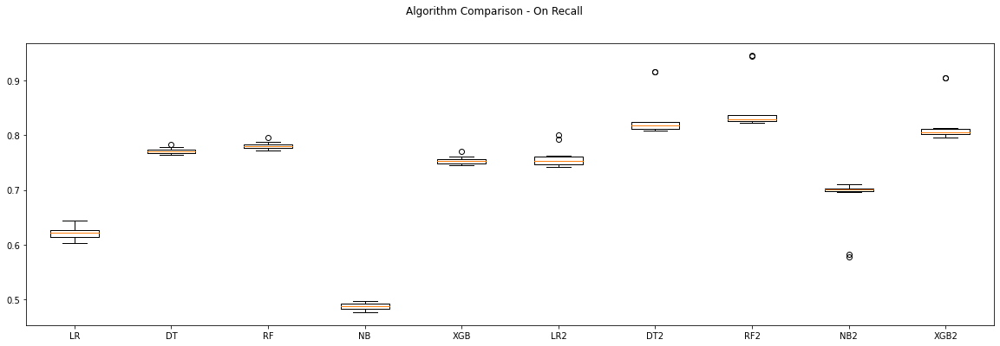

In [25]:
# prepare models
models = []
models.append(('LR', LogisticRegression()))
models.append(('DT', DecisionTreeClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('NB', BernoulliNB()))
models.append(('XGB', XGBClassifier()))
models.append(('LR2', LogisticRegression()))
models.append(('DT2', DecisionTreeClassifier()))
models.append(('RF2', RandomForestClassifier()))
models.append(('NB2', BernoulliNB()))
models.append(('XGB2', XGBClassifier()))

# scoring
results = []
names = []
scoring = 'recall'

# evaluate each model in turn for normal & oversampled data
for name, model in models:
        kfold = KFold(n_splits=10, random_state=seed)
        if "2" in name:
            cv_results = cross_val_score(model, x_trainres, y_trainres, cv=kfold, scoring=scoring)
        else:
            cv_results = cross_val_score(model, x_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)
            
# boxplot algorithm comparison for normal & oversampled data
fig = plt.figure(figsize=(20,6))
fig.suptitle('Algorithm Comparison - On Recall')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

- The highest overall Recall score is achieved by RF2 (RandomForestClassifier-Oversampled) with an average score of 0.852
- The second highest overall Recall score is achieved by DT2 (DecisionTreeClassifier-Oversampled) with an average score of 0.836

### ------------- ON F1 SCORE -------------

LR: 0.699188 (0.009194)
DT: 0.772950 (0.003889)
RF: 0.797788 (0.005056)
NB: 0.617826 (0.005233)
XGB: 0.791256 (0.006162)
LR2: 0.759742 (0.063792)
DT2: 0.824675 (0.066027)
RF2: 0.845852 (0.063648)
NB2: 0.715569 (0.011371)
XGB2: 0.827800 (0.061610)


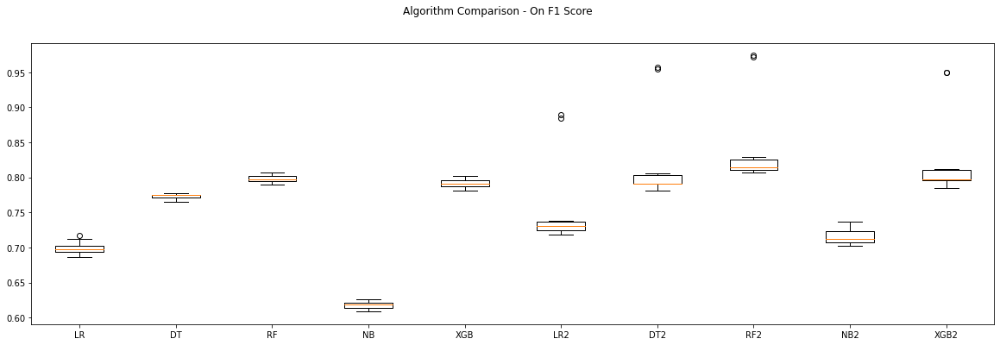

In [14]:
# prepare models
models = []
models.append(('LR', LogisticRegression()))
models.append(('DT', DecisionTreeClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('NB', BernoulliNB()))
models.append(('XGB', XGBClassifier()))
models.append(('LR2', LogisticRegression()))
models.append(('DT2', DecisionTreeClassifier()))
models.append(('RF2', RandomForestClassifier()))
models.append(('NB2', BernoulliNB()))
models.append(('XGB2', XGBClassifier()))

# scoring
results = []
names = []
scoring = 'f1'

# evaluate each model in turn for normal & oversampled data
for name, model in models:
        kfold = KFold(n_splits=10, random_state=seed)
        if "2" in name:
            cv_results = cross_val_score(model, x_trainres, y_trainres, cv=kfold, scoring=scoring)
        else:
            cv_results = cross_val_score(model, x_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)
            
# boxplot algorithm comparison for normal & oversampled data
fig = plt.figure(figsize=(20,6))
fig.suptitle('Algorithm Comparison - On F1 Score')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

- The highest overall F1 score is achieved by RF2 (RandomForestClassifier-Oversampled) with an average score of 0.846
- The second highest overall F1 score is achieved by XGB2 (XGBoostClassifier-Oversampled) with an average score of 0.828

### ------------- ON ROC-AUC -------------

LR: 0.873131 (0.002665)
DT: 0.825221 (0.002028)
RF: 0.927985 (0.002485)
NB: 0.841647 (0.002994)
XGB: 0.928589 (0.002500)
LR2: 0.889192 (0.022433)
DT2: 0.863379 (0.028684)
RF2: 0.951436 (0.020376)
NB2: 0.864547 (0.028121)
XGB2: 0.944062 (0.019760)


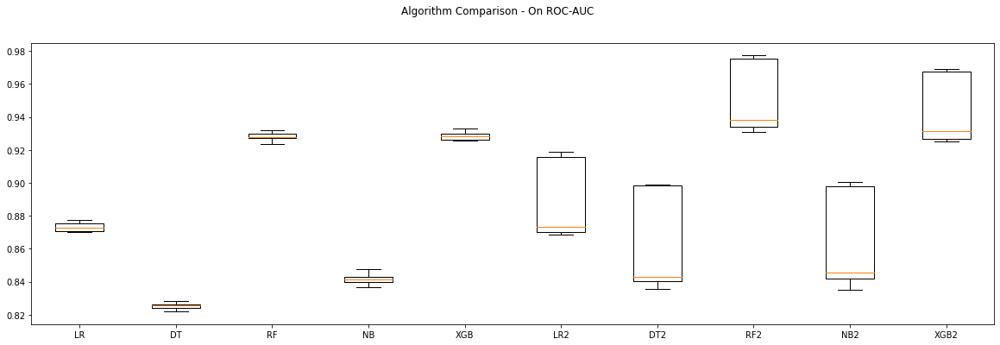

In [13]:
# prepare models
models = []
models.append(('LR', LogisticRegression()))
models.append(('DT', DecisionTreeClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('NB', BernoulliNB()))
models.append(('XGB', XGBClassifier()))
models.append(('LR2', LogisticRegression()))
models.append(('DT2', DecisionTreeClassifier()))
models.append(('RF2', RandomForestClassifier()))
models.append(('NB2', BernoulliNB()))
models.append(('XGB2', XGBClassifier()))

# scoring
results = []
names = []

# evaluate each model in turn for normal & oversampled data        
for name, model in models:
    if "2" in name:
        cv_results = cross_val_score(model, x_trainres, y_trainres, cv=10, n_jobs=-3, scoring = 'roc_auc')
    else:
        cv_results = cross_val_score(model, x_train, y_train, cv=10, n_jobs=-3, scoring= 'roc_auc')
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
            
# boxplot algorithm comparison for normal & oversampled data
fig = plt.figure(figsize=(20,6))
fig.suptitle('Algorithm Comparison - On ROC-AUC')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

- The highest overall ROC-AUC score is achieved by RF2 (RandomForestClassifier-Oversampled) with an average score of 0.951
- The second highest overall ROC-AUC score is achieved by XGB2 (XGBoostClassifier-Oversampled) with an average score of 0.944

### 4d) Model Selection & Description 

- In overall, the model that shows the top most consistent performances across parameters, especially in Recall score, is the RF2 (RandomForestClassifier-Oversampled) model. Therefore, we will use this model for further analysis & hyperparameter tuning.

### -------------------------- RANDOM FOREST CLASSIFIER ----------------------------

In [30]:
# model fitting for normal data
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(random_state=7)
rfc.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=7, verbose=0,
                       warm_start=False)

In [31]:
# model fitting for oversampled data
from sklearn.ensemble import RandomForestClassifier
rfc2 = RandomForestClassifier(random_state=7)
rfc2.fit(x_trainres, y_trainres)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=7, verbose=0,
                       warm_start=False)

In [41]:
# importing relevant libraries
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score

# normal - classification report for train & test data
print("### TRAIN DATA (NORMAL)")
print(classification_report(y_train, rfc.predict(x_train)))
rfc_pred = rfc.predict(x_test)
print("### TEST DATA (NORMAL)")
print(classification_report(y_test, rfc_pred))

# oversampled - classification report for train & test data
print("### TRAIN DATA (OVERSAMPLED)")
print(classification_report(y_trainres, rfc2.predict(x_trainres)))
rfc_pred2 = rfc2.predict(x_test)
print("### TEST DATA (OVERSAMPLED)")
print(classification_report(y_test, rfc_pred2))

### TRAIN DATA (NORMAL)
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     59743
           1       0.98      0.98      0.98     35375

    accuracy                           0.98     95118
   macro avg       0.98      0.98      0.98     95118
weighted avg       0.98      0.98      0.98     95118

### TEST DATA (NORMAL)
              precision    recall  f1-score   support

           0       0.88      0.90      0.89     15002
           1       0.82      0.79      0.80      8778

    accuracy                           0.86     23780
   macro avg       0.85      0.84      0.84     23780
weighted avg       0.86      0.86      0.86     23780

### TRAIN DATA (OVERSAMPLED)
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     59743
           1       0.99      0.99      0.99     59743

    accuracy                           0.99    119486
   macro avg       0.99      0.99      0.99    11948

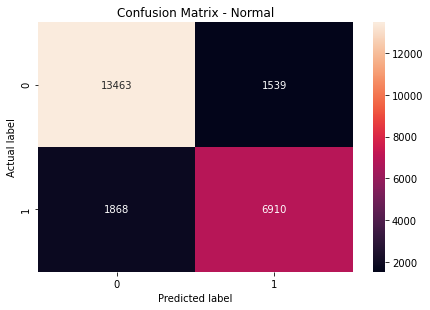

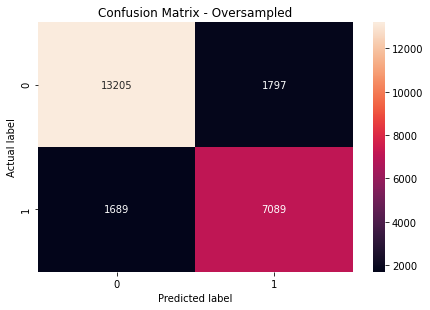

In [42]:
# confusion matrix for normal data
cnf_matrix = confusion_matrix(y_test, rfc_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Normal')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

# confusion matrix for oversampled data
cnf_matrix = confusion_matrix(y_test, rfc_pred2)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - Oversampled')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

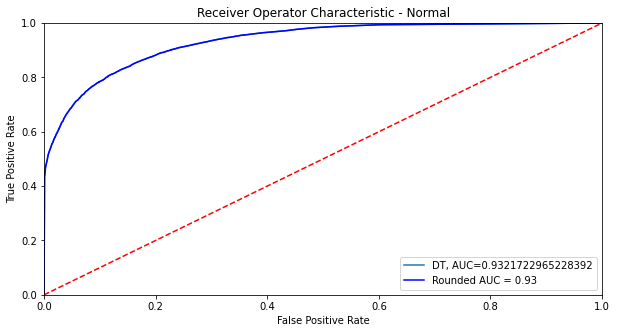

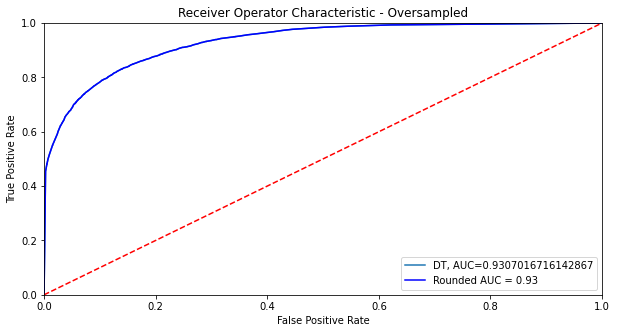

In [32]:
# ROC-AUC Score
from sklearn import metrics
for i in range(2):
    if i == 0:
        pred_proba = rfc.predict_proba(x_test)[::,1]
    elif i == 1:
        pred_proba = rfc2.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test, pred_proba)
    auc = metrics.roc_auc_score(y_test, pred_proba)
    roc_auc = metrics.auc(fpr, tpr)
    plt.figure(figsize= (10,5))
    if i == 0:
        plt.title('Receiver Operator Characteristic - Normal')
    elif i == 1:
        plt.title('Receiver Operator Characteristic - Oversampled')
    plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
    plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
    plt.legend(loc = 'lower right')
    plt.plot([0,1], [0,1], 'r--')
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc=4)
    plt.show()

From the observations:
- We could see that the outcomes of RF2 (RandomForestClassifier-Oversampled) & RF (RandomForestClassifier-Normal) are both equally good. Their Accuracy & ROC-AUC scores are very high, this is a good thing. Their Accuracy scores of >= 0.85 means that 85% of the total events are predicted with the right/actual labels. And their ROC-AUC scores of 0.93 means that the models have a 93% probability of distinguishing between cancelling & staying orders.  
- Nevertheless, since in this case we're trying to minimize incidents of False Negatives (labeled canceling orders as staying orders), we should give prioritization & optimization on Recall score. In terms of Recall of cancelling orders, RF2 has the higher score of and should be the one used for predicting cancelling orders.

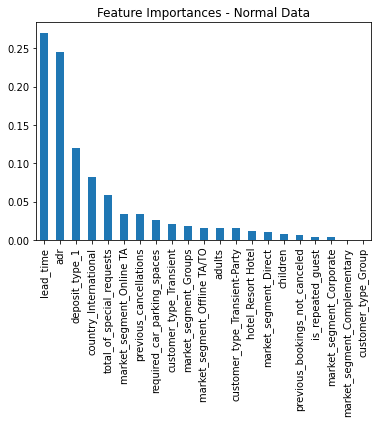

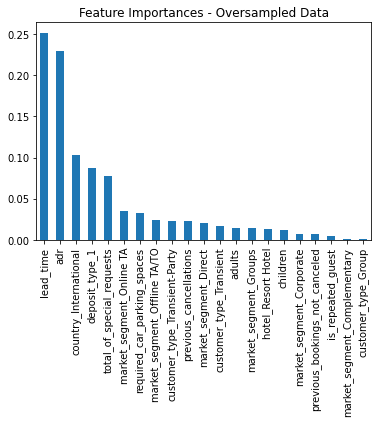

In [89]:
# feature importance for normal data
rfc_coef1 = pd.Series(rfc.feature_importances_, x_train.columns).sort_values(ascending= False)
rfc_coef1.plot(kind = 'bar', title='Feature Importances - Normal Data')
plt.show()

# feature importance for oversampled data
rfc_coef2 = pd.Series(rfc2.feature_importances_, x_trainres.columns).sort_values(ascending= False)
rfc_coef2.plot(kind = 'bar', title='Feature Importances - Oversampled Data')
plt.show()

From the observations:
- From feature importance we can see which features that contribute to the most information gained in predicting our target. Those top features that are consistently shown in the normal & oversampled data is lead_time (amount of days between booking & arrival date) & adr (average daily rate). Special notice to country, deposit_type & total_of_special_requests feature that appears to approximate the top features in both data. In other words, all of these features are important for our model in predicting cancelling orders.

In [109]:
# permutation importance for normal data
from eli5 import show_weights
from eli5.sklearn import PermutationImportance

rfcperm = PermutationImportance(rfc, scoring = 'roc_auc', random_state= 7).fit(x_test, y_test)
show_weights(rfcperm, feature_names = list(x_test.columns))

Weight,Feature
0.0900 ± 0.0020,country_International
0.0806 ± 0.0042,lead_time
0.0581 ± 0.0040,adr
0.0548 ± 0.0031,total_of_special_requests
0.0504 ± 0.0015,deposit_type_1
0.0435 ± 0.0014,market_segment_Online TA
0.0313 ± 0.0030,customer_type_Transient
0.0244 ± 0.0026,required_car_parking_spaces
0.0195 ± 0.0012,previous_cancellations
0.0194 ± 0.0010,hotel_Resort Hotel


In [110]:
# permutation importance for oversampled data
rfcperm2 = PermutationImportance(rfc2, scoring = 'roc_auc', random_state= 7).fit(x_test, y_test)
show_weights(rfcperm2, feature_names = list(x_test.columns))

Weight,Feature
0.0944 ± 0.0025,country_International
0.0818 ± 0.0039,lead_time
0.0616 ± 0.0030,total_of_special_requests
0.0603 ± 0.0040,adr
0.0405 ± 0.0012,deposit_type_1
0.0364 ± 0.0010,market_segment_Offline TA/TO
0.0272 ± 0.0016,market_segment_Online TA
0.0271 ± 0.0008,customer_type_Transient-Party
0.0259 ± 0.0027,required_car_parking_spaces
0.0203 ± 0.0007,market_segment_Direct


From the observations:
- From the permutation feature importance, we can see the upper features (green) that contribute the most to the drop of the overall model scores if the feature's values are randomly shuffled. Those top features that are consistent on the top (in the darkest of green shades) in both normal & oversampled data are country, lead_time, adr, total_of_special_requests & deposit_type. Special notice for market_segment that came amongst the top in both data. In other words, all of these features are important for our model in predicting cancelling orders.

### -------------------------- RANDOM FOREST CLASSIFIER (HYPERPARAMETER TUNING) ----------------------------

In [43]:
## GRIDSEARCHCV
from sklearn.model_selection import GridSearchCV

grid1 = GridSearchCV(estimator = rfc2,
                    refit = 'recall',
                    param_grid = {'random_state': np.arange(1,101)}, 
                    scoring = 'recall',
                    cv = 5, n_jobs = -1)

In [44]:
grid1.fit(x_trainres, y_trainres)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,...
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  3

In [46]:
# best parameters
grid1.best_params_

{'random_state': 16}

In [41]:
# model fitting for oversampled data
from sklearn.ensemble import RandomForestClassifier
rfc3 = RandomForestClassifier(random_state=16)
rfc3.fit(x_trainres, y_trainres)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=16, verbose=0,
                       warm_start=False)

In [50]:
# oversampled - classification report for train & test data
print("### TRAIN DATA (OVERSAMPLED)")
print(classification_report(y_trainres, rfc3.predict(x_trainres)))
rfc_pred3 = rfc3.predict(x_test)
print("### TEST DATA (OVERSAMPLED)")
print(classification_report(y_test, rfc_pred3))

### TRAIN DATA (OVERSAMPLED)
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     59743
           1       0.99      0.99      0.99     59743

    accuracy                           0.99    119486
   macro avg       0.99      0.99      0.99    119486
weighted avg       0.99      0.99      0.99    119486

### TEST DATA (OVERSAMPLED)
              precision    recall  f1-score   support

           0       0.89      0.88      0.88     15002
           1       0.80      0.81      0.80      8778

    accuracy                           0.85     23780
   macro avg       0.84      0.84      0.84     23780
weighted avg       0.85      0.85      0.85     23780



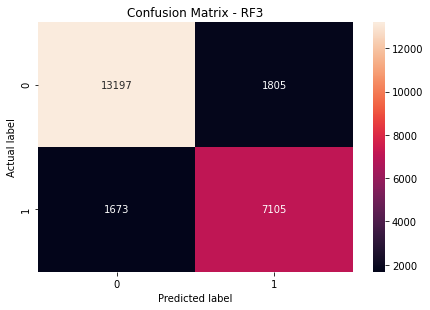

In [51]:
# confusion matrix
cnf_matrix = confusion_matrix(y_test, rfc_pred3)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - RF3')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

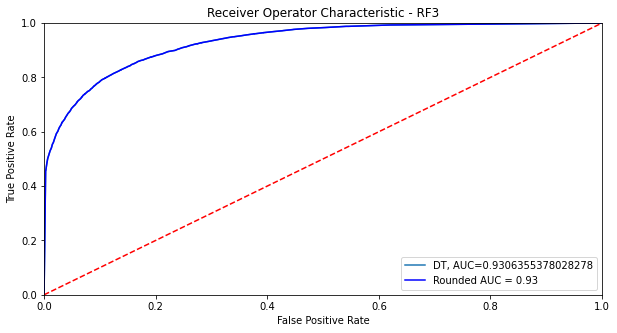

In [52]:
# ROC-AUC Score
from sklearn import metrics
pred_proba = rfc3.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, pred_proba)
auc = metrics.roc_auc_score(y_test, pred_proba)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - RF3')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

In [49]:
grid2 = GridSearchCV(estimator = rfc2,
                    refit = 'recall',
                    param_grid = {
                        'n_estimators':[1000,1800],
                        'bootstrap': [True,False],
                        'max_features': ['sqrt','auto'],
                        'max_depth': [80,None],
                        }, 
                    scoring = 'recall',
                    cv = 5, n_jobs = -1)

In [50]:
grid2.fit(x_trainres, y_trainres)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=16,
                                  

In [53]:
# best parameters
grid2.best_params_

{'bootstrap': True,
 'max_depth': 80,
 'max_features': 'sqrt',
 'n_estimators': 1000}

In [45]:
# model fitting for oversampled data
from sklearn.ensemble import RandomForestClassifier
rfc4 = RandomForestClassifier(bootstrap=True, max_depth=80, max_features= 'sqrt', n_estimators= 1000)
rfc4.fit(x_trainres, y_trainres)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=80, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [47]:
# oversampled - classification report for train & test data
print("### TRAIN DATA (OVERSAMPLED)")
print(classification_report(y_trainres, rfc4.predict(x_trainres)))
rfc_pred4 = rfc4.predict(x_test)
print("### TEST DATA (OVERSAMPLED)")
print(classification_report(y_test, rfc_pred4))

### TRAIN DATA (OVERSAMPLED)
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     59743
           1       0.99      0.99      0.99     59743

    accuracy                           0.99    119486
   macro avg       0.99      0.99      0.99    119486
weighted avg       0.99      0.99      0.99    119486

### TEST DATA (OVERSAMPLED)
              precision    recall  f1-score   support

           0       0.89      0.88      0.88     15002
           1       0.80      0.81      0.80      8778

    accuracy                           0.85     23780
   macro avg       0.84      0.85      0.84     23780
weighted avg       0.86      0.85      0.85     23780



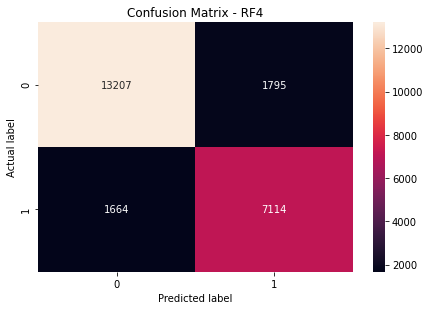

In [48]:
# confusion matrix
cnf_matrix = confusion_matrix(y_test, rfc_pred4)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - RF4')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

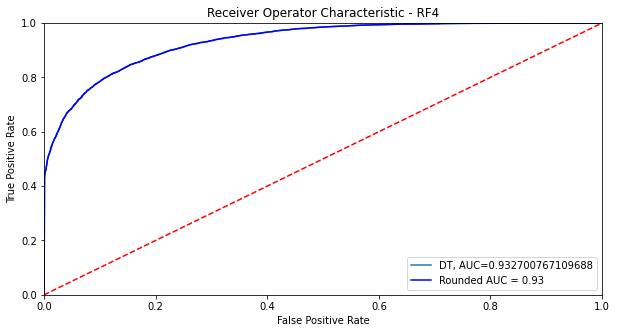

In [49]:
# ROC-AUC Score
from sklearn import metrics
pred_proba = rfc4.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, pred_proba)
auc = metrics.roc_auc_score(y_test, pred_proba)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - RF4')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

From the observations:
- We could see that our trials of hyperparameter tuning haven't generated much improvement. Nevertheless, special notes on both tuned models that they generate less & less False Negatives than our non-tuned RF2, from 1689 cases (RF2) lowered to 1673 cases (RF3) and finally to 1664 cases (RF4) of False Negatives (with levels of Accuracy & ROC-AUC score staying the same).
- We should then try to build our autoML model for our the next step of comparison. 

### -------------------------- AUTOML CLASSIFIER ----------------------------

In [12]:
# let's benchmark our tuned model performance with AutoML
from tpot import TPOTClassifier
tpot = TPOTClassifier(subsample = 0.8, verbosity = 2, warm_start=True, early_stop=20, max_time_mins= 60, n_jobs= -2)

In [13]:
# fitting TPOT to our data
tpot.fit(x_train, y_train)

Generation 1 - Current best internal CV score: 0.8546796989130637

66.63 minutes have elapsed. TPOT will close down.
TPOT closed during evaluation in one generation.


TPOT closed prematurely. Will use the current best pipeline.

Best pipeline: KNeighborsClassifier(FastICA(input_matrix, tol=0.0), n_neighbors=57, p=1, weights=distance)


TPOTClassifier(config_dict=None, crossover_rate=0.1, cv=5,
               disable_update_check=False, early_stop=20, generations=100,
               max_eval_time_mins=5, max_time_mins=60, memory=None,
               mutation_rate=0.9, n_jobs=-2, offspring_size=None,
               periodic_checkpoint_folder=None, population_size=100,
               random_state=None, scoring=None, subsample=0.8, template=None,
               use_dask=False, verbosity=2, warm_start=True)

In [14]:
 # exporting our model results
tpot.export('tpot_HOTEL.py')

In [22]:
# using our exported AutoML model ('tpot_HOTEL.py') to our data
import numpy as np
import pandas as pd
from sklearn.decomposition import FastICA
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline

# fitting the AutoML for our data
autoML = make_pipeline(
    FastICA(tol=0.0),
    KNeighborsClassifier(n_neighbors=57, p=1, weights="distance"))

autoML.fit(x_train, y_train)

Pipeline(memory=None,
         steps=[('fastica',
                 FastICA(algorithm='parallel', fun='logcosh', fun_args=None,
                         max_iter=200, n_components=None, random_state=None,
                         tol=0.0, w_init=None, whiten=True)),
                ('kneighborsclassifier',
                 KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                      metric='minkowski', metric_params=None,
                                      n_jobs=None, n_neighbors=57, p=1,
                                      weights='distance'))],
         verbose=False)

In [34]:
# normal - classification report for train & test data
print("### TRAIN DATA")
print(classification_report(y_train, autoML.predict(x_train)))
autoML_pred = autoML.predict(x_test)
print("### TEST DATA")
print(classification_report(y_test, autoML_pred))

### TRAIN DATA
              precision    recall  f1-score   support

           0       0.98      0.99      0.99     59743
           1       0.99      0.97      0.98     35375

    accuracy                           0.98     95118
   macro avg       0.98      0.98      0.98     95118
weighted avg       0.98      0.98      0.98     95118

### TEST DATA
              precision    recall  f1-score   support

           0       0.88      0.91      0.89     15002
           1       0.84      0.78      0.81      8778

    accuracy                           0.86     23780
   macro avg       0.86      0.85      0.85     23780
weighted avg       0.86      0.86      0.86     23780



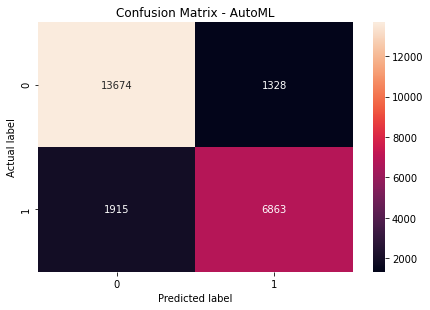

In [36]:
# confusion matrix for normal data
cnf_matrix = confusion_matrix(y_test, autoML_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True,  fmt='g')
plt.tight_layout()
plt.title('Confusion Matrix - AutoML')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

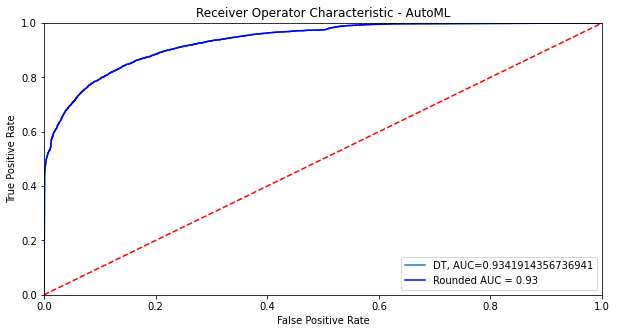

In [37]:
# ROC-AUC Score
from sklearn import metrics
pred_proba = autoML.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, pred_proba)
auc = metrics.roc_auc_score(y_test, pred_proba)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,5))
plt.title('Receiver Operator Characteristic - AutoML')
plt.plot(fpr,tpr,label="DT, AUC="+str(auc))
plt.plot(fpr, tpr, 'b', label= 'Rounded AUC = {}'.format(round(roc_auc,2)))
plt.legend(loc = 'lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

From the observations:
- We could see that our trials of autoML haven't generated much improvement as well. Although it has slightly higher levels of F1 Score, it shows lower levels of Recall score on our cancelling orders. Its level of False Negatives is even higher than our non-tuned RF2, from 1689 cases (RF2) increased to 1915 cases (autoML). It seems that our RF2 & tuned RF2 (RF3 & RF4) performs better than the autoML model

### 4e) Learning Curve

- From the previous analysis, we have seen that RF2 (RandomForestClassifier-Oversampled) has good performance but RF4 (RandomForestClassifier-OversampledTuned) is slightly better. These models are also better than the autoML model generated. Therefore, we will use both of this model to check their learning curves.

train mean: 
[0.99055585 0.99213218 0.99133274 0.9887485  0.98483665]
test mean: 
[0.70631085 0.66928621 0.69483754 0.72383814 0.727514  ]


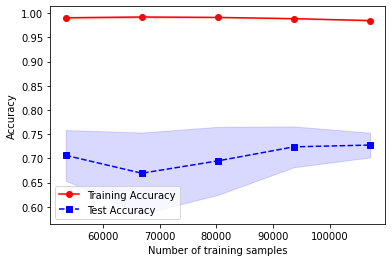

In [40]:
# RF2
from sklearn.model_selection import learning_curve
train_sizes, train_scores, test_scores = learning_curve(estimator=rfc2,
                                                       X=x,
                                                       y=y,
                                                       train_sizes=np.linspace(0.5, 1.0, 5),
                                                       cv=10)
# Mean value of accuracy against training data
train_mean = np.mean(train_scores, axis=1)
                                                        
print('train mean: ')
print(train_mean)
                                                        
# Standard deviation of training accuracy per number of training samples
train_std = np.std(train_scores, axis=1)


# Same as above for test data
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)
print('test mean: ')
print(test_mean)

# Plot training accuracies 
plt.plot(train_sizes, train_mean, color='red', marker='o', label='Training Accuracy')
# Plot the variance of training accuracies
plt.fill_between(train_sizes,
                train_mean + train_std,
                train_mean - train_std,
                alpha=0.15, color='red')

# Plot for test data as training data
plt.plot(train_sizes, test_mean, color='blue', linestyle='--', marker='s', 
        label='Test Accuracy')
plt.fill_between(train_sizes,
                test_mean + test_std,
                test_mean - test_std,
                alpha=0.15, color='blue')

plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

train mean: 
[0.99056519 0.99214264 0.9913452  0.98878268 0.98486468]
test mean: 
[0.70592395 0.66901704 0.69659533 0.72531    0.72748026]


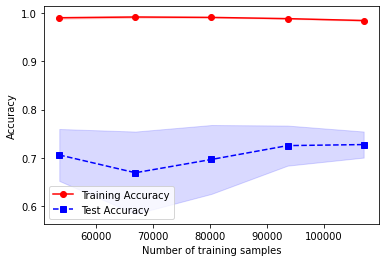

In [53]:
# RF4
train_sizes, train_scores, test_scores = learning_curve(estimator=rfc4,
                                                       X=x,
                                                       y=y,
                                                       train_sizes=np.linspace(0.5, 1.0, 5),
                                                       cv=10)
# Mean value of accuracy against training data
train_mean = np.mean(train_scores, axis=1)
                                                        
print('train mean: ')
print(train_mean)
                                                        
# Standard deviation of training accuracy per number of training samples
train_std = np.std(train_scores, axis=1)


# Same as above for test data
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)
print('test mean: ')
print(test_mean)

# Plot training accuracies 
plt.plot(train_sizes, train_mean, color='red', marker='o', label='Training Accuracy')
# Plot the variance of training accuracies
plt.fill_between(train_sizes,
                train_mean + train_std,
                train_mean - train_std,
                alpha=0.15, color='red')

# Plot for test data as training data
plt.plot(train_sizes, test_mean, color='blue', linestyle='--', marker='s', 
        label='Test Accuracy')
plt.fill_between(train_sizes,
                test_mean + test_std,
                test_mean - test_std,
                alpha=0.15, color='blue')

plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

From the observations:
- We could see that the test accuracy scores of both RF models (RF2 &RF4) are lower than the train scores. The test accuracy scores have reached levels of 0.7 having the train scores of near 1, this is good actually. However, seeing from the generalization gaps, we can see that our models has a predisposition to overfit tha data. Nevertheless, our models still performs excellently in the previous test:train data of 20%:80%. Perhaps, more samples could be given to the model to see what it could achive further. All in all, both model is still usable with RF4 being more preferable.


In [103]:
# saving algorithm for further usage
import pickle
filename = 'hotel_cancellation_tuned.sav';
pickle.dump(rfc4, open(filename, 'wb'))

## 5. CONCLUDING NOTES

#### 1) On features:
Through all the observations, there are at many features that keeps showing significance and they are lead_time, adr, market_Ssegment, country, previous_cancellations and deposit_type features, with lead_time perhaps as the most important feature in relation to cancelling orders ('is_canceled'). In other words, these features could be the features that has better explanatory relations towards our target variable of cancelling orders and may prove to be important for further observations & practical applications.

#### 2) On predictions:
In overall, the best model for our prediction is RandomForestClassifier-Oversampled that's hyperparameter-tuned (RF4). It even gives better results than the autoML model, especially in its Recall score since we're trying to minimize False Negatives in our predictions. This model may be useful for further descriptions & deployments.